In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [3]:
! cat ../IMAGES/f1.1/predict-f1.1/labels/marius_hills_r00000_c00000.txt

0 0.928872 0.590383 0.0594766 0.0653036


In [22]:
# 

In [1]:
1+0

1

In [29]:
import os
import re
from pathlib import Path
import pandas as pd

# 1. Define the path to your labels directory
labels_dir = Path("../IMAGES/f1.1/predict-f1.1/labels/")

# Regular expression to extract the numbers after 'r' and 'c'
# This matches '_r' followed by digits, and '_c' followed by digits
loc_pattern = re.compile(r"_r(\d+)_c(\d+)")

data = []

# 2. Iterate through all .txt files in the folder
for file_path in labels_dir.glob("*.txt"):
    if file_path.stat().st_size == 0:
        continue
        
    # Extract row and col from filename
    match = loc_pattern.search(file_path.name)
    if match:
        row_loc = int(match.group(1))  # Converts e.g., "00019" -> 19
        col_loc = int(match.group(2))
    else:
        row_loc, col_loc = None, None # Fallback if format differs
        
    with open(file_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
                
            class_id = int(parts[0])
            coords = [float(x) for x in parts[1:]]
            
            # Include row_loc and col_loc in the row data
            row = [file_path.name, row_loc, col_loc, class_id] + coords
            data.append(row)

# 3. Define column names dynamically
max_cols = max(len(row) for row in data) if data else 8
if max_cols == 9:  # Includes confidence score
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height", "confidence"]
else:
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height"]

# 4. Create the DataFrame
df = pd.DataFrame(data, columns=columns)

# Verify the new columns
# print(df[["filename", "grid_row", "grid_col", "class_id"]].head())

In [30]:
df

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00000_c00000.txt,0,0,0,0.928872,0.590383,0.059477,0.065304
1,marius_hills_r00000_c00001.txt,0,1,0,0.428937,0.591061,0.061724,0.064168
2,marius_hills_r00000_c00005.txt,0,5,0,0.613133,0.589695,0.045548,0.062020
3,marius_hills_r00000_c00006.txt,0,6,0,0.114524,0.590312,0.047370,0.061108
4,marius_hills_r00000_c00007.txt,0,7,0,0.853499,0.778270,0.024157,0.025792
...,...,...,...,...,...,...,...,...
63952,marius_hills_r00088_c00172.txt,88,172,0,0.256020,0.344778,0.020426,0.019925
63953,marius_hills_r00088_c00174.txt,88,174,0,0.088005,0.395710,0.055296,0.058732
63954,marius_hills_r00088_c00175.txt,88,175,0,0.669468,0.351019,0.024520,0.024666
63955,marius_hills_r00088_c00176.txt,88,176,0,0.511094,0.385100,0.039091,0.036999


In [31]:
df['class_id']='Impact Crater'

In [32]:
df

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00000_c00000.txt,0,0,Impact Crater,0.928872,0.590383,0.059477,0.065304
1,marius_hills_r00000_c00001.txt,0,1,Impact Crater,0.428937,0.591061,0.061724,0.064168
2,marius_hills_r00000_c00005.txt,0,5,Impact Crater,0.613133,0.589695,0.045548,0.062020
3,marius_hills_r00000_c00006.txt,0,6,Impact Crater,0.114524,0.590312,0.047370,0.061108
4,marius_hills_r00000_c00007.txt,0,7,Impact Crater,0.853499,0.778270,0.024157,0.025792
...,...,...,...,...,...,...,...,...
63952,marius_hills_r00088_c00172.txt,88,172,Impact Crater,0.256020,0.344778,0.020426,0.019925
63953,marius_hills_r00088_c00174.txt,88,174,Impact Crater,0.088005,0.395710,0.055296,0.058732
63954,marius_hills_r00088_c00175.txt,88,175,Impact Crater,0.669468,0.351019,0.024520,0.024666
63955,marius_hills_r00088_c00176.txt,88,176,Impact Crater,0.511094,0.385100,0.039091,0.036999


In [42]:
import os
import re
from pathlib import Path
import pandas as pd

# 1. Define the path to your labels directory
labels_dir = Path("../IMAGES/f1.2/predict-f1.2/labels/")

# Regular expression to extract the numbers after 'r' and 'c'
# This matches '_r' followed by digits, and '_c' followed by digits
loc_pattern = re.compile(r"_r(\d+)_c(\d+)")

data = []

# 2. Iterate through all .txt files in the folder
for file_path in labels_dir.glob("*.txt"):
    if file_path.stat().st_size == 0:
        continue
        
    # Extract row and col from filename
    match = loc_pattern.search(file_path.name)
    if match:
        row_loc = int(match.group(1))  # Converts e.g., "00019" -> 19
        col_loc = int(match.group(2))
    else:
        row_loc, col_loc = None, None # Fallback if format differs
        
    with open(file_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
                
            class_id = int(parts[0])
            coords = [float(x) for x in parts[1:]]
            
            # Include row_loc and col_loc in the row data
            row = [file_path.name, row_loc, col_loc, class_id] + coords
            data.append(row)

# 3. Define column names dynamically
max_cols = max(len(row) for row in data) if data else 8
if max_cols == 9:  # Includes confidence score
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height", "confidence"]
else:
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height"]

# 4. Create the DataFrame
df1_2 = pd.DataFrame(data, columns=columns)

# Verify the new columns
# print(df[["filename", "grid_row", "grid_col", "class_id"]].head())

In [43]:
mapping = {
    0:'pit_skylight',
    1:'irregular_mare_patch',
    2:'apollo_site',
}
df1_2['class_id'] = df1_2['class_id'].replace(mapping)

In [44]:
df1_2['class_id'].unique()

array(['apollo_site', 'pit_skylight', 'irregular_mare_patch'],
      dtype=object)

In [45]:
df1_2 

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00001_c00086.txt,1,86,apollo_site,0.684853,0.570668,0.030926,0.030773
1,marius_hills_r00001_c00087.txt,1,87,apollo_site,0.184869,0.570709,0.030951,0.030783
2,marius_hills_r00002_c00023.txt,2,23,apollo_site,0.838216,0.992915,0.033256,0.014170
3,marius_hills_r00002_c00024.txt,2,24,apollo_site,0.338218,0.992892,0.033230,0.014216
4,marius_hills_r00002_c00092.txt,2,92,apollo_site,0.775505,0.439313,0.028439,0.031044
...,...,...,...,...,...,...,...,...
336,marius_hills_r00086_c00058.txt,86,58,apollo_site,0.373708,0.440345,0.032093,0.031586
337,marius_hills_r00086_c00111.txt,86,111,apollo_site,0.779866,0.677887,0.031544,0.031206
338,marius_hills_r00086_c00112.txt,86,112,apollo_site,0.279892,0.677906,0.031578,0.031218
339,marius_hills_r00087_c00111.txt,87,111,apollo_site,0.779866,0.177912,0.031586,0.031229


In [46]:
import os
import re
from pathlib import Path
import pandas as pd

# 1. Define the path to your labels directory
labels_dir = Path("../IMAGES/f2.1/predict-f2.1/labels/")

# Regular expression to extract the numbers after 'r' and 'c'
# This matches '_r' followed by digits, and '_c' followed by digits
loc_pattern = re.compile(r"_r(\d+)_c(\d+)")

data = []

# 2. Iterate through all .txt files in the folder
for file_path in labels_dir.glob("*.txt"):
    if file_path.stat().st_size == 0:
        continue
        
    # Extract row and col from filename
    match = loc_pattern.search(file_path.name)
    if match:
        row_loc = int(match.group(1))  # Converts e.g., "00019" -> 19
        col_loc = int(match.group(2))
    else:
        row_loc, col_loc = None, None # Fallback if format differs
        
    with open(file_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
                
            class_id = int(parts[0])
            coords = [float(x) for x in parts[1:]]
            
            # Include row_loc and col_loc in the row data
            row = [file_path.name, row_loc, col_loc, class_id] + coords
            data.append(row)

# 3. Define column names dynamically
max_cols = max(len(row) for row in data) if data else 8
if max_cols == 9:  # Includes confidence score
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height", "confidence"]
else:
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height"]

# 4. Create the DataFrame
df2_1 = pd.DataFrame(data, columns=columns)

# Verify the new columns
# print(df[["filename", "grid_row", "grid_col", "class_id"]].head())

In [47]:
df2_1['class_id'] = 'Wrinkle ridge'

In [48]:
df2_1

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00007_c00022.txt,7,22,Wrinkle ridge,0.619989,0.577303,0.064183,0.074744
1,marius_hills_r00007_c00023.txt,7,23,Wrinkle ridge,0.118735,0.576431,0.066481,0.071098
2,marius_hills_r00010_c00080.txt,10,80,Wrinkle ridge,0.273690,0.442228,0.069856,0.086985
3,marius_hills_r00012_c00079.txt,12,79,Wrinkle ridge,0.627208,0.857943,0.119282,0.056161
4,marius_hills_r00012_c00080.txt,12,80,Wrinkle ridge,0.129793,0.857546,0.121703,0.052083
...,...,...,...,...,...,...,...,...
6038,marius_hills_r00076_c00133.txt,76,133,Wrinkle ridge,0.175443,0.215854,0.066594,0.051603
6039,marius_hills_r00076_c00133.txt,76,133,Wrinkle ridge,0.073855,0.309815,0.057526,0.092916
6040,marius_hills_r00076_c00133.txt,76,133,Wrinkle ridge,0.573432,0.326834,0.077337,0.083076
6041,marius_hills_r00076_c00134.txt,76,134,Wrinkle ridge,0.071352,0.325159,0.071965,0.072352


In [49]:
import os
import re
from pathlib import Path
import pandas as pd

# 1. Define the path to your labels directory
labels_dir = Path("../IMAGES/f2.2/predict-f2.2/labels/")

# Regular expression to extract the numbers after 'r' and 'c'
# This matches '_r' followed by digits, and '_c' followed by digits
loc_pattern = re.compile(r"_r(\d+)_c(\d+)")

data = []

# 2. Iterate through all .txt files in the folder
for file_path in labels_dir.glob("*.txt"):
    if file_path.stat().st_size == 0:
        continue
        
    # Extract row and col from filename
    match = loc_pattern.search(file_path.name)
    if match:
        row_loc = int(match.group(1))  # Converts e.g., "00019" -> 19
        col_loc = int(match.group(2))
    else:
        row_loc, col_loc = None, None # Fallback if format differs
        
    with open(file_path, "r") as f:
        for line in f:
            parts = line.strip().split()
            if not parts:
                continue
                
            class_id = int(parts[0])
            coords = [float(x) for x in parts[1:]]
            
            # Include row_loc and col_loc in the row data
            row = [file_path.name, row_loc, col_loc, class_id] + coords
            data.append(row)

# 3. Define column names dynamically
max_cols = max(len(row) for row in data) if data else 8
if max_cols == 9:  # Includes confidence score
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height", "confidence"]
else:
    columns = ["filename", "grid_row", "grid_col", "class_id", "x_center", "y_center", "width", "height"]

# 4. Create the DataFrame
df2_2 = pd.DataFrame(data, columns=columns)
mapping = {
    0:'lobate_scarp',
    1:'candidate_rille',
}
df2_2['class_id'] = df2_2['class_id'].replace(mapping)
# Verify the new columns
# print(df[["filename", "grid_row", "grid_col", "class_id"]].head())

In [51]:
df2_2

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00004_c00019.txt,4,19,lobate_scarp,0.010594,0.533164,0.021172,0.045456
1,marius_hills_r00004_c00080.txt,4,80,lobate_scarp,0.530545,0.873010,0.024530,0.029796
2,marius_hills_r00004_c00081.txt,4,81,lobate_scarp,0.028576,0.873631,0.025444,0.030179
3,marius_hills_r00005_c00011.txt,5,11,lobate_scarp,0.014442,0.953266,0.026346,0.038559
4,marius_hills_r00005_c00019.txt,5,19,lobate_scarp,0.010344,0.031154,0.020688,0.046739
...,...,...,...,...,...,...,...,...
155,marius_hills_r00080_c00077.txt,80,77,lobate_scarp,0.923977,0.879098,0.023214,0.026413
156,marius_hills_r00080_c00078.txt,80,78,lobate_scarp,0.424173,0.879142,0.023201,0.026352
157,marius_hills_r00081_c00077.txt,81,77,lobate_scarp,0.923969,0.379097,0.023299,0.026480
158,marius_hills_r00081_c00078.txt,81,78,lobate_scarp,0.424172,0.379141,0.023276,0.026412


In [52]:
DATA = pd.concat([df,df1_2,df2_1,df2_2],ignore_index=True)

In [54]:
DATA['grid_row'].unique()

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88])

In [56]:
DATA[ (DATA['grid_row'] == 44) & (DATA['class_id'] == 'Impact Crater')]

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
47670,marius_hills_r00044_c00001.txt,44,1,Impact Crater,0.879253,0.361855,0.052617,0.063384
47671,marius_hills_r00044_c00001.txt,44,1,Impact Crater,0.569987,0.366639,0.101714,0.057711
47672,marius_hills_r00044_c00001.txt,44,1,Impact Crater,0.813419,0.378064,0.028167,0.025120
47673,marius_hills_r00044_c00002.txt,44,2,Impact Crater,0.379194,0.361894,0.052083,0.063370
47674,marius_hills_r00044_c00002.txt,44,2,Impact Crater,0.069603,0.367758,0.103756,0.060249
...,...,...,...,...,...,...,...,...
47874,marius_hills_r00044_c00178.txt,44,178,Impact Crater,0.261537,0.349056,0.028294,0.027603
47875,marius_hills_r00044_c00178.txt,44,178,Impact Crater,0.401628,0.342994,0.034956,0.053242
47876,marius_hills_r00044_c00178.txt,44,178,Impact Crater,0.268027,0.300009,0.056815,0.049625
47877,marius_hills_r00044_c00178.txt,44,178,Impact Crater,0.576803,0.310222,0.024021,0.035380


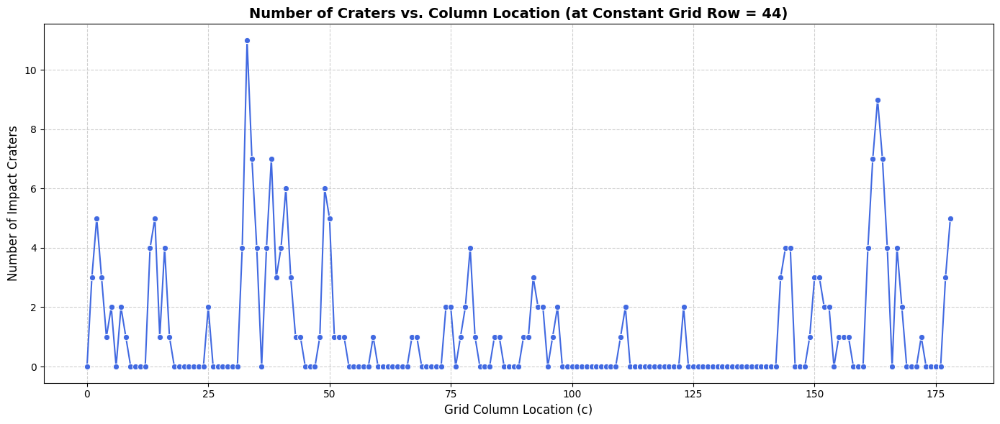

In [60]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Define the constant row you want to look at
target_row = 44

# 2. Filter for the specific row and class_id ('Impact Crater')
# Note: If class_id is an integer in your raw df, change 'Impact Crater' to its corresponding ID.
crater_slice = DATA[(DATA['grid_row'] == target_row) & (DATA['class_id'] == 'Impact Crater')]

# 3. Count the number of craters per grid_col location
# .reindex() ensures that columns with 0 craters are included in the plot rather than missing
min_col, max_col = DATA['grid_col'].min(), DATA['grid_col'].max()
crater_counts = (
    crater_slice.groupby('grid_col')
    .size()
    .reindex(range(min_col, max_col + 1), fill_value=0)
    .reset_index(name='crater_count')
)

# 4. Create the plot
plt.figure(figsize=(14, 6))
sns.lineplot(data=crater_counts, x='grid_col', y='crater_count', marker='o', color='royalblue', linewidth=1.5)

# 5. Styling and labels
plt.title(f"Number of Craters vs. Column Location (at Constant Grid Row = {target_row})", fontsize=14, fontweight='bold')
plt.xlabel("Grid Column Location (c)", fontsize=12)
plt.ylabel("Number of Impact Craters", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.6)

# Display the plot
plt.tight_layout()
plt.show()

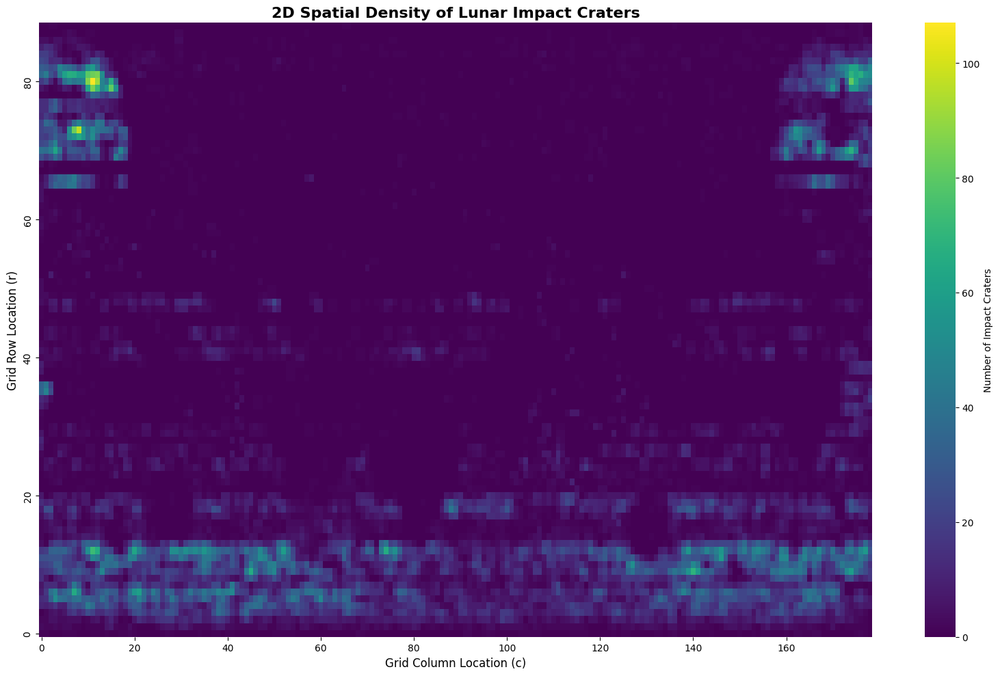

In [66]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Filter for only the craters
crater_data = DATA[DATA['class_id'] == 'Impact Crater']

# 2. Count craters by both row and column, then pivot into a 2D grid matrix
# This automatically puts grid_row on the y-axis and grid_col on the x-axis
heatmap_data = (
    crater_data.groupby(['grid_row', 'grid_col'])
    .size()
    .unstack(fill_value=0)  # Fills any missing (r, c) combinations with 0 craters
)

# 3. Optional: Reindex to ensure the grid includes all rows and columns even if completely empty
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)
heatmap_data = heatmap_data.reindex(index=all_rows, columns=all_cols, fill_value=0)

# 4. Create the 2D density plot
plt.figure(figsize=(16, 10))

# 'viridis', 'inferno', or 'magma' work beautifully for scientific spatial densities
sns.heatmap(
    heatmap_data, 
    cmap='viridis', 
    cbar_kws={'label': 'Number of Impact Craters'},
    xticklabels=20,  # Only show an axis label every 20 ticks so it's readable
    yticklabels=20
)

# 5. Styling and orientation fixes
plt.title("2D Spatial Density of Lunar Impact Craters", fontsize=16, fontweight='bold')
plt.xlabel("Grid Column Location (c)", fontsize=12)
plt.ylabel("Grid Row Location (r)", fontsize=12)

# Invert y-axis if your row 0 starts at the top (standard image/matrix coordinates)
plt.gca().invert_yaxis() 

plt.tight_layout()
plt.show()

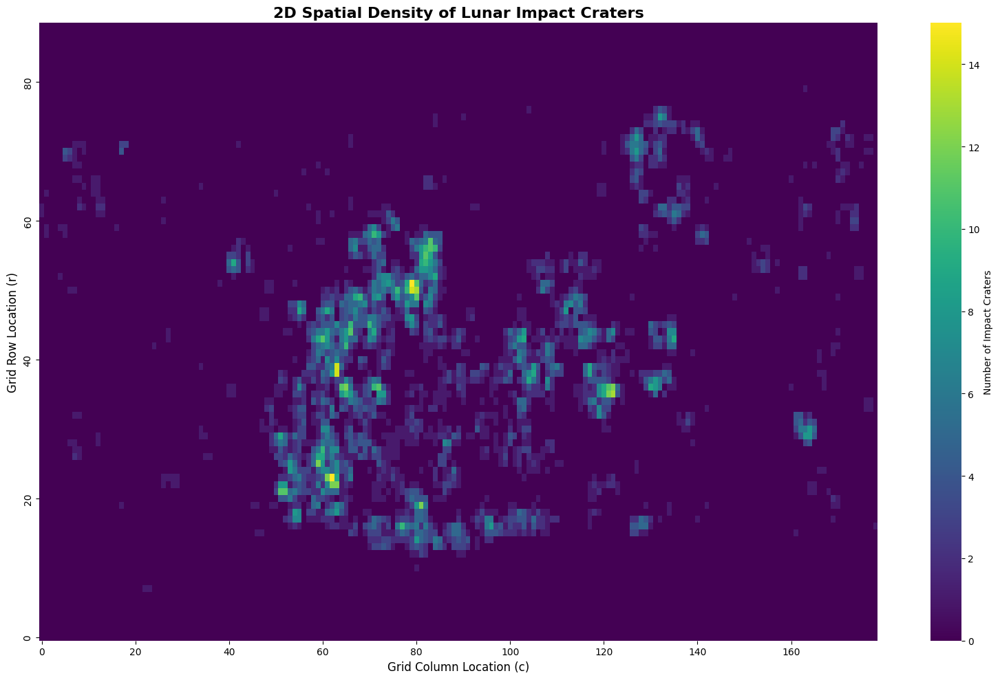

In [62]:
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Filter for only the craters
crater_data = DATA[DATA['class_id'] == 'Wrinkle ridge']

# 2. Count craters by both row and column, then pivot into a 2D grid matrix
# This automatically puts grid_row on the y-axis and grid_col on the x-axis
heatmap_data = (
    crater_data.groupby(['grid_row', 'grid_col'])
    .size()
    .unstack(fill_value=0)  # Fills any missing (r, c) combinations with 0 craters
)

# 3. Optional: Reindex to ensure the grid includes all rows and columns even if completely empty
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)
heatmap_data = heatmap_data.reindex(index=all_rows, columns=all_cols, fill_value=0)

# 4. Create the 2D density plot
plt.figure(figsize=(16, 10))

# 'viridis', 'inferno', or 'magma' work beautifully for scientific spatial densities
sns.heatmap(
    heatmap_data, 
    cmap='viridis', 
    cbar_kws={'label': 'Number of Impact Craters'},
    xticklabels=20,  # Only show an axis label every 20 ticks so it's readable
    yticklabels=20
)

# 5. Styling and orientation fixes
plt.title("2D Spatial Density of Lunar Impact Craters", fontsize=16, fontweight='bold')
plt.xlabel("Grid Column Location (c)", fontsize=12)
plt.ylabel("Grid Row Location (r)", fontsize=12)

# Invert y-axis if your row 0 starts at the top (standard image/matrix coordinates)
plt.gca().invert_yaxis() 

plt.tight_layout()
plt.show()

<>:52: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:52: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
/tmp/ipykernel_2289/1030019330.py:52: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
  plt.ylabel("Singular Value Magnitude ($\sigma$)")


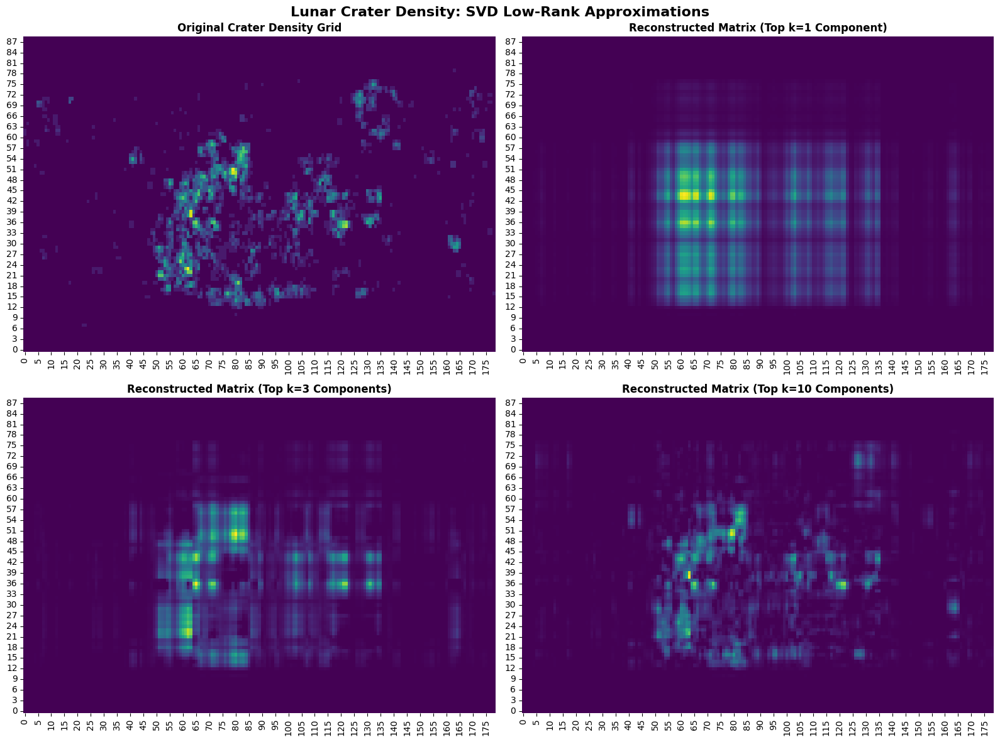

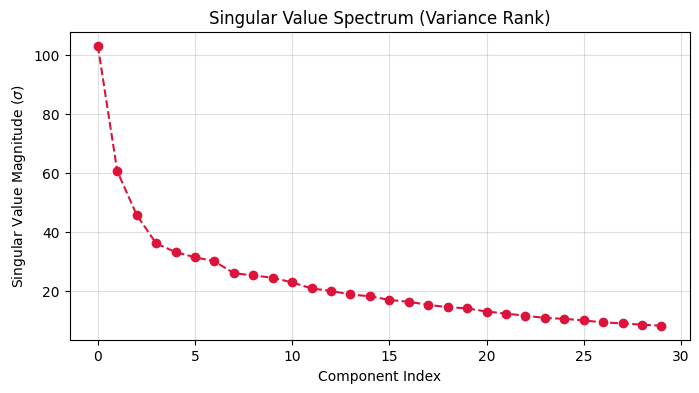

In [64]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare your matrix (ensure it's floating-point for SVD)
# Assuming 'heatmap_data' is the pivoted DataFrame from the previous step
M = heatmap_data.to_numpy().astype(float)

# 2. Perform Singular Value Decomposition
# U: Left singular vectors (row/latitude patterns)
# S: Singular values (array of 1D values tracking variance/importance)
# Vt: Right singular vectors (column/longitude patterns)
U, S, Vt = np.linalg.svd(M, full_matrices=False)

# 3. Choose the number of top singular values for reconstruction
# Let's look at a few options to see how the grid updates
k_values = [1, 3, 10] 

# --- PLOTTING ---
fig, axes = plt.subplots(2, 2, figsize=(16, 12))
axes = axes.flatten()

# Plot 1: Original Heatmap
sns.heatmap(M, cmap='viridis', ax=axes[0], cbar=False)
axes[0].set_title("Original Crater Density Grid", fontsize=12, fontweight='bold')
axes[0].invert_yaxis()

# Loop through our chosen k-values to reconstruct and plot
for i, k in enumerate(k_values, start=1):
    # Reconstruct using only the top k components: U[:, :k] * S[:k] * Vt[:k, :]
    # np.diag(S[:k]) turns the slice of singular values into a diagonal matrix
    M_reconstructed = U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]
    
    # Clip negative values to 0 since negative crater counts aren't physically real
    M_reconstructed = np.clip(M_reconstructed, a_min=0, a_max=None)
    
    sns.heatmap(M_reconstructed, cmap='viridis', ax=axes[i], cbar=False)
    #axes[i].set_title(True if k == 1 else f"Reconstructed Matrix (Top k={k} Components)", fontsize=12, fontweight='bold')
    title_text = f"Reconstructed Matrix (Top k={k} Component)" if k == 1 else f"Reconstructed Matrix (Top k={k} Components)"
    axes[i].set_title(title_text, fontsize=12, fontweight='bold')
    axes[i].invert_yaxis()

plt.suptitle("Lunar Crater Density: SVD Low-Rank Approximations", fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout()
plt.show()

# --- OPTIONAL: Plot Singular Value Spectrum (Scree Plot) ---
plt.figure(figsize=(8, 4))
plt.plot(S[:30], marker='o', color='crimson', linestyle='--')
plt.title("Singular Value Spectrum (Variance Rank)")
plt.xlabel("Component Index")
plt.ylabel("Singular Value Magnitude ($\sigma$)")
plt.grid(True, alpha=0.4)
plt.show()

<>:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/2583079540.py:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  fig.colorbar(im, ax=axes[1], label='Log Magnitude ($\log(1 + |X|)$)')


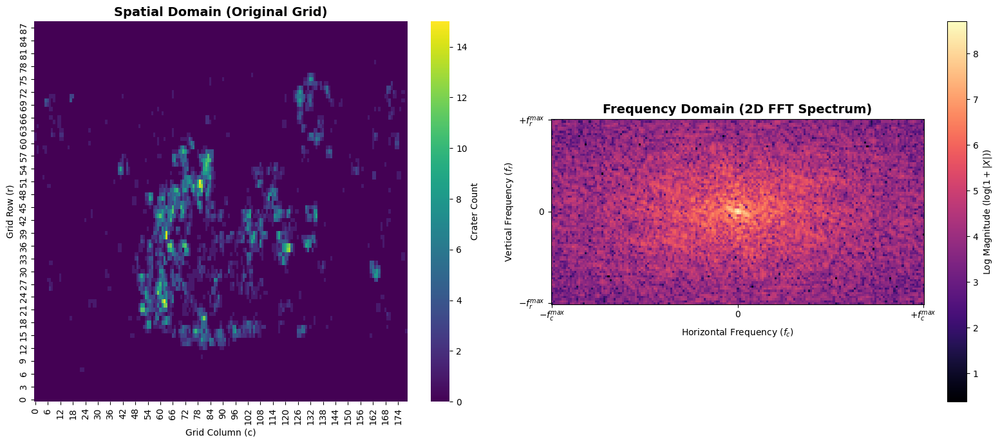

In [65]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare your matrix 
# Assuming 'heatmap_data' is your pivoted DataFrame
M = heatmap_data.to_numpy().astype(float)

# 2. Compute the 2D Fourier Transform
# np.fft.fft2 computes the raw frequency spectrum
fft_raw = np.fft.fft2(M)

# np.fft.fftshift moves the zero-frequency component (DC component) 
# from the top-left corner to the center of the matrix for intuitive viewing
fft_shifted = np.fft.fftshift(fft_raw)

# 3. Calculate the Magnitude Spectrum
# Taking the absolute value gives the magnitude of each frequency component
magnitude_spectrum = np.abs(fft_shifted)

# Apply a log transform so that low-amplitude high-frequencies 
# are visible alongside dominant low-frequency components
log_magnitude = np.log1p(magnitude_spectrum)

# --- PLOTTING ---
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Plot 1: Original Spatial Grid
sns.heatmap(M, cmap='viridis', ax=axes[0], cbar_kws={'label': 'Crater Count'})
axes[0].set_title("Spatial Domain (Original Grid)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Grid Column (c)")
axes[0].set_ylabel("Grid Row (r)")
axes[0].invert_yaxis()

# Plot 2: 2D FFT Magnitude Spectrum
# Using 'magma' or 'inferno' colormaps makes energy spikes visually pop out
im = axes[1].imshow(log_magnitude, cmap='magma', origin='lower')
fig.colorbar(im, ax=axes[1], label='Log Magnitude ($\log(1 + |X|)$)')

# Center the tick labels around zero (relative frequencies)
rows, cols = M.shape
axes[1].set_xticks([0, cols//2, cols-1])
axes[1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
axes[1].set_yticks([0, rows//2, rows-1])
axes[1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])

axes[1].set_title("Frequency Domain (2D FFT Spectrum)", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Horizontal Frequency ($f_c$)")
axes[1].set_ylabel("Vertical Frequency ($f_r$)")

plt.tight_layout()
plt.show()

<>:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/2583079540.py:38: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  fig.colorbar(im, ax=axes[1], label='Log Magnitude ($\log(1 + |X|)$)')


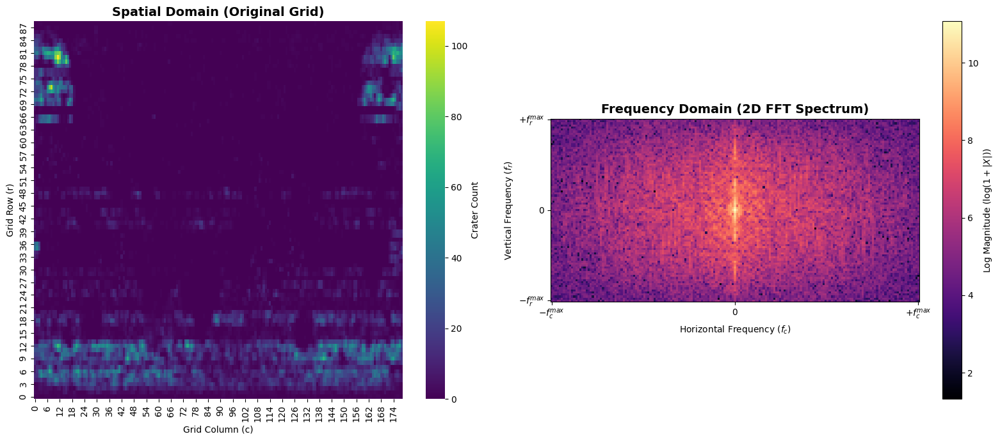

In [67]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare your matrix 
# Assuming 'heatmap_data' is your pivoted DataFrame
M = heatmap_data.to_numpy().astype(float)

# 2. Compute the 2D Fourier Transform
# np.fft.fft2 computes the raw frequency spectrum
fft_raw = np.fft.fft2(M)

# np.fft.fftshift moves the zero-frequency component (DC component) 
# from the top-left corner to the center of the matrix for intuitive viewing
fft_shifted = np.fft.fftshift(fft_raw)

# 3. Calculate the Magnitude Spectrum
# Taking the absolute value gives the magnitude of each frequency component
magnitude_spectrum = np.abs(fft_shifted)

# Apply a log transform so that low-amplitude high-frequencies 
# are visible alongside dominant low-frequency components
log_magnitude = np.log1p(magnitude_spectrum)

# --- PLOTTING ---
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

# Plot 1: Original Spatial Grid
sns.heatmap(M, cmap='viridis', ax=axes[0], cbar_kws={'label': 'Crater Count'})
axes[0].set_title("Spatial Domain (Original Grid)", fontsize=14, fontweight='bold')
axes[0].set_xlabel("Grid Column (c)")
axes[0].set_ylabel("Grid Row (r)")
axes[0].invert_yaxis()

# Plot 2: 2D FFT Magnitude Spectrum
# Using 'magma' or 'inferno' colormaps makes energy spikes visually pop out
im = axes[1].imshow(log_magnitude, cmap='magma', origin='lower')
fig.colorbar(im, ax=axes[1], label='Log Magnitude ($\log(1 + |X|)$)')

# Center the tick labels around zero (relative frequencies)
rows, cols = M.shape
axes[1].set_xticks([0, cols//2, cols-1])
axes[1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
axes[1].set_yticks([0, rows//2, rows-1])
axes[1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])

axes[1].set_title("Frequency Domain (2D FFT Spectrum)", fontsize=14, fontweight='bold')
axes[1].set_xlabel("Horizontal Frequency ($f_c$)")
axes[1].set_ylabel("Vertical Frequency ($f_r$)")

plt.tight_layout()
plt.show()

In [68]:
DATA

,filename,grid_row,grid_col,class_id,x_center,y_center,width,height
0,marius_hills_r00000_c00000.txt,0,0,Impact Crater,0.928872,0.590383,0.059477,0.065304
1,marius_hills_r00000_c00001.txt,0,1,Impact Crater,0.428937,0.591061,0.061724,0.064168
2,marius_hills_r00000_c00005.txt,0,5,Impact Crater,0.613133,0.589695,0.045548,0.062020
3,marius_hills_r00000_c00006.txt,0,6,Impact Crater,0.114524,0.590312,0.047370,0.061108
4,marius_hills_r00000_c00007.txt,0,7,Impact Crater,0.853499,0.778270,0.024157,0.025792
...,...,...,...,...,...,...,...,...
70496,marius_hills_r00080_c00077.txt,80,77,lobate_scarp,0.923977,0.879098,0.023214,0.026413
70497,marius_hills_r00080_c00078.txt,80,78,lobate_scarp,0.424173,0.879142,0.023201,0.026352
70498,marius_hills_r00081_c00077.txt,81,77,lobate_scarp,0.923969,0.379097,0.023299,0.026480
70499,marius_hills_r00081_c00078.txt,81,78,lobate_scarp,0.424172,0.379141,0.023276,0.026412


<>:31: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:31: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/48061516.py:31: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  plt.xlabel("$\log_{10}(\text{Area})$ [Relative to Tile Size]", fontsize=12)
/home/alireza/my_env/lib/python3.14/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


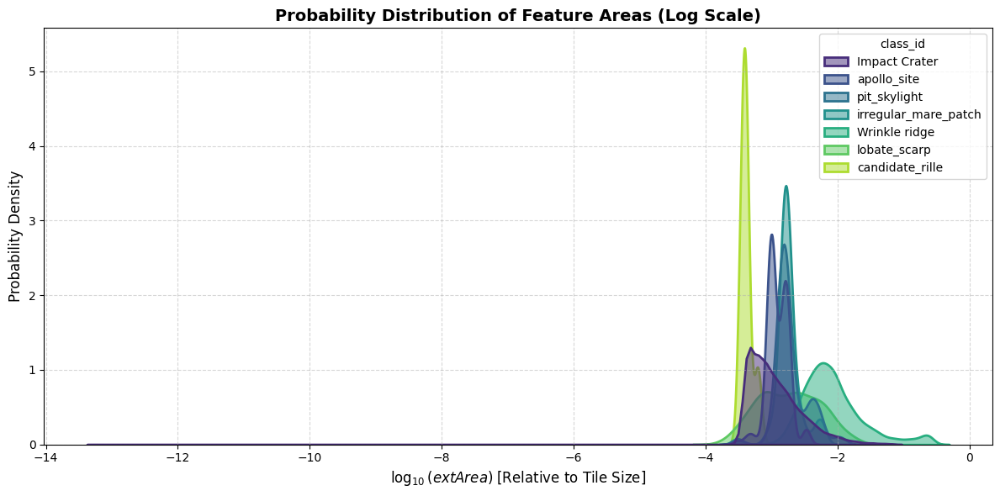

In [69]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. محاسبه مساحت نسبی (حاصل‌ضرب عرض در ارتفاع)
DATA['area'] = DATA['width'] * DATA['height']

# نکته فیزیکی/آماری: چون اندازه‌ دهانه‌ها معمولاً از قانون توان (Power Law) پیروی می‌کند
# و دهانه‌های بسیار ریز خیلی بیشتر از دهانه‌های بزرگ هستند،
# گرفتن لگاریتم کمک می‌کند توزیع را بسیار بهتر و ملموس‌تر ببینیم.
DATA['log_area'] = np.log10(DATA['area'])

# ۲. تنظیمات شکل ظاهری نمودار
plt.figure(figsize=(12, 6))

# ۳. رسم تابع توزیع احتمال (KDE) به تفکیک هر فیچر (class_id)
# پارامتر fill درون منحنی را رنگ می‌کند و common_norm=False مساحت هر منحنی را مستقل نرمال می‌کند
sns.kdeplot(
    data=DATA, 
    x='log_area', 
    hue='class_id', 
    fill=True, 
    common_norm=False, 
    palette='viridis', 
    linewidth=2,
    alpha=0.5
)

# ۴. زیباسازی و برچسب‌گذاری محورها
plt.title("Probability Distribution of Feature Areas (Log Scale)", fontsize=14, fontweight='bold')
plt.xlabel("$\log_{10}(\text{Area})$ [Relative to Tile Size]", fontsize=12)
plt.ylabel("Probability Density", fontsize=12)
plt.grid(True, linestyle='--', alpha=0.5)

# نمایش نمودار
plt.tight_layout()
plt.show()

<>:34: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:34: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/4277343992.py:34: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")
/home/alireza/my_env/lib/python3.14/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


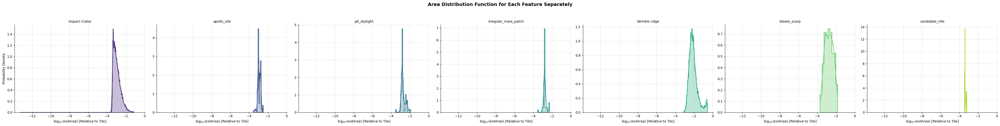

In [70]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. مطمئن می‌شویم ستون‌های مساحت و لگاریتم مساحت مقداردهی شده‌اند
DATA['area'] = DATA['width'] * DATA['height']
DATA['log_area'] = np.log10(DATA['area'])

# ۲. ساخت یک شبکه از نمودارها به تفکیک class_id
# پارامتر col='class_id' نمودارها را کنار هم می‌چیند (اگر ترجیح می‌دهید زیر هم باشند از row='class_id' استفاده کنید)
# sharey=False اجازه می‌دهد مقیاس محور y برای هر فیچر مستقل باشد تا اگر تعداد کلاسی خیلی کمتر است، منحنی آن له نشود
g = sns.FacetGrid(
    DATA, 
    col="class_id", 
    hue="class_id", 
    palette="viridis", 
    sharey=False, 
    height=5, 
    aspect=1.2
)

# ۳. رسم هیستوگرام و منحنی چگالی (KDE) در هر زیرنمودار
g.map_dataframe(
    sns.histplot, 
    x="log_area", 
    kde=True, 
    element="step", 
    stat="density", 
    alpha=0.3, 
    linewidth=1.5
)

# ۴. تنظیمات فواصل و برچسب‌های محورها
g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")
g.set_titles(col_template="{col_name}")  # نام هر کلاس را به عنوان تیتر بالای نمودارش می‌گذارد

# فعال کردن شبکه پس‌زمینه برای تمامی زیرنمودارها
for ax in g.axes.flat:
    ax.grid(True, linestyle='--', alpha=0.5)

# عنوان کلی برای تمام پنجره‌ها
plt.suptitle("Area Distribution Function for Each Feature Separately", fontsize=14, fontweight='bold', y=1.05)

plt.tight_layout()

<>:33: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:33: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/1526707694.py:33: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")
/home/alireza/my_env/lib/python3.14/site-packages/pandas/core/arraylike.py:402: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)


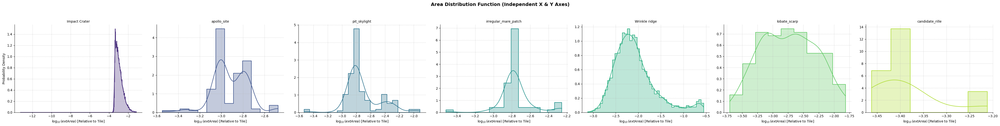

In [71]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. محاسبه مساحت و لگاریتم آن
DATA['area'] = DATA['width'] * DATA['height']
DATA['log_area'] = np.log10(DATA['area'])

# ۲. ساخت شبکه نمودارها با محورهای X و Y کاملاً مستقل (sharex=False و sharey=False)
g = sns.FacetGrid(
    DATA, 
    col="class_id", 
    hue="class_id", 
    palette="viridis", 
    sharex=False,  # <--- آزاد کردن محور افقی برای هر نمودار
    sharey=False,  # <--- آزاد کردن محور عمودی برای هر نمودار
    height=5, 
    aspect=1.2
)

# ۳. رسم هیستوگرام و منحنی چگالی
g.map_dataframe(
    sns.histplot, 
    x="log_area", 
    kde=True, 
    element="step", 
    stat="density", 
    alpha=0.3, 
    linewidth=1.5
)

# ۴. تنظیمات نهایی و برچسب‌ها
g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")
g.set_titles(col_template="{col_name}")

for ax in g.axes.flat:
    ax.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Area Distribution Function (Independent X & Y Axes)", fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

<>:45: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
<>:45: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
/tmp/ipykernel_2289/486632141.py:45: SyntaxWarning: "\l" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\l"? A raw string is also an option.
  g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")


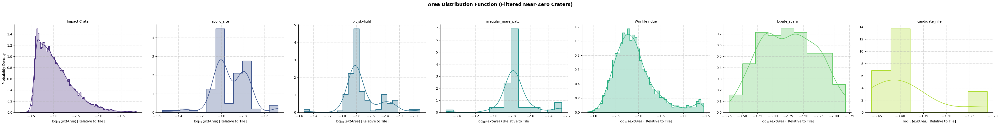

In [80]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. محاسبه مساحت نسبی
DATA['area'] = DATA['width'] * DATA['height']

# ۲. فیلتر کردن مقادیر صفر و بسیار نزدیک به صفر برای کلاس Crater
# در اینجا به عنوان مثال دهانه‌هایی با مساحت کمتر از 0.0001 (یک ده-هزارم ابعاد تایل) حذف می‌شوند.
# می‌توانید این عدد را بسته به ابعاد تصاویرتان تغییر دهید.
threshold = 0.0001

filtered_data = DATA[
    ~((DATA['class_id'] == 'Impact Crater') & (DATA['area'] <= threshold)) & 
    (DATA['area'] > 0) # اطمینان از اینکه مساحت مطلقاً صفر در هیچ کلاسی وارد محاسبه لگاریتم نشود
].copy()

# ۳. محاسبه لگاریتم مساحت برای داده‌های فیلتر شده
filtered_data['log_area'] = np.log10(filtered_data['area'])

# ۴. ساخت شبکه نمودارها با محورهای کاملاً مستقل
g = sns.FacetGrid(
    filtered_data, 
    col="class_id", 
    hue="class_id", 
    palette="viridis", 
    sharex=False, 
    sharey=False, 
    height=5, 
    aspect=1.2
)

# ۵. رسم هیستوگرام و منحنی چگالی احتمال
g.map_dataframe(
    sns.histplot, 
    x="log_area", 
    kde=True, 
    element="step", 
    stat="density", 
    alpha=0.3, 
    linewidth=1.5
)

# ۶. تنظیمات نهایی برچسب‌ها
g.set_axis_labels("$\log_{10}(\text{Area})$ [Relative to Tile]", "Probability Density")
g.set_titles(col_template="{col_name}")

for ax in g.axes.flat:
    ax.grid(True, linestyle='--', alpha=0.5)

plt.suptitle("Area Distribution Function (Filtered Near-Zero Craters)", fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
# plt.show()
plt.savefig("pdfarea.png")

<>:40: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:41: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:40: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:41: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
/tmp/ipykernel_2289/251846732.py:40: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
  plt.xlabel("Horizontal Spatial Lag ($\Delta c$)")
/tmp/ipykernel_2289/251846732.py:41: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\

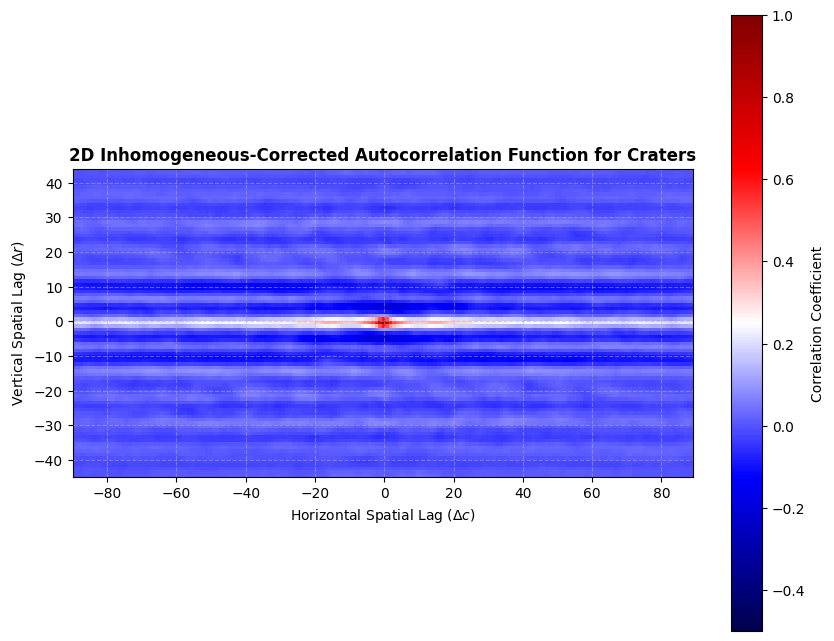

In [73]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal

# ۱. آماده‌سازی ماتریس دوبعدی چگالی دهانه‌ها
# فرض می‌کنیم heatmap_data ماتریس ۲بعدی چگالی دهانه‌های شماست که قبلاً ساختیم
M = heatmap_data.to_numpy().astype(float)

# ۲. رفع ناهمگنی محیط (Detrending / High-pass Filtering)
# برای حذف اثر ناهمگنی محیط، میانگین محلی را با یک فیلتر گوسی یا فیلتر یکنواخت بزرگ حساب کرده
# و از ماتریس اصلی کم می‌کنیم تا فقط نوسانات و کورلیشن‌های ساختاری دهانه‌ها باقی بماند.
local_mean = signal.convolve2d(M, np.ones((15, 15))/225.0, mode='same', boundary='symm')
M_homogenized = M - local_mean

# ۳. محاسبه خودهمبستگی دوبعدی (2D Autocorrelation) با استفاده از FFT (برای سرعت بالا)
# این کار میزان وابستگی فضایی یک نقطه را به نقاط مجاورش در تمام جهت‌های دو‌بعدی نشان می‌دهد.
# ابتدا میانگین نوسانات را صفر می‌کنیم
M_centered = M_homogenized - np.mean(M_homogenized)

# محاسبه کورلیشن با استفاده از قضیه وینر-کینچین (Wiener-Khinchin) از طریق FFT
f_transform = np.fft.fft2(M_centered)
power_spectrum = np.abs(f_transform) ** 2
autocorr = np.fft.ifft2(power_spectrum)
autocorr = np.fft.fftshift(autocorr).real  # انتقال نقطه صفر کورلیشن به مرکز ماتریس

# نرمال‌سازی تا مقدار مرکز (تأخیر صفر) برابر ۱ شود
autocorr_normalized = autocorr / np.max(autocorr)

# ۴. رسم خروجی تابع کورلیشن دوبعدی
plt.figure(figsize=(10, 8))
rows, cols = autocorr_normalized.shape

# بازه محورها را به صورت جابجایی (Lag) تعریف می‌کنیم
extent = [-cols//2, cols//2, -rows//2, rows//2]

im = plt.imshow(autocorr_normalized, cmap='seismic', extent=extent, origin='lower', vmin=-0.5, vmax=1.0)
plt.colorbar(im, label='Correlation Coefficient')

plt.title("2D Inhomogeneous-Corrected Autocorrelation Function for Craters", fontsize=12, fontweight='bold')
plt.xlabel("Horizontal Spatial Lag ($\Delta c$)")
plt.ylabel("Vertical Spatial Lag ($\Delta r$)")
plt.grid(True, linestyle='--', alpha=0.5)

plt.show()

<>:62: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:64: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:62: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
<>:64: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
/tmp/ipykernel_2289/3892348907.py:62: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\D"? A raw string is also an option.
  axes[idx].set_xlabel("Horizontal Lag ($\Delta c$)")
/tmp/ipykernel_2289/3892348907.py:64: SyntaxWarning: "\D" is an invalid escape sequence. Such sequences will not work in the future. Did you mean

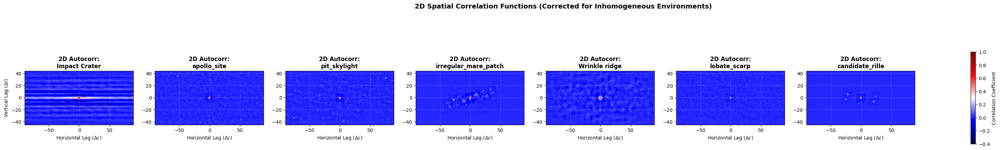

In [79]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد (مانند Impact Crater و بقیه)
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# ۲. تعریف ابعاد شبکه تصاویر برای رسم (زیر هم یا کنار هم)
fig, axes = plt.subplots(1, num_classes, figsize=(6 * num_classes, 5), squeeze=False)
axes = axes.flatten()

# تعریف محدوده کامل ماتریس بر اساس کل محدوده سطر و ستون موجود در داده‌ها
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۳. حلقه روی هر فیچر برای محاسبه و رسم تابع کورلیشن
for idx, cid in enumerate(unique_classes):
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # مطمئن می‌شویم ابعاد ماتریس با کل شبکه هماهنگ است و جاهای خالی با 0 پر می‌شود
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # ج) رفع اثر ناهمگنی محیط با حذف میانگین محلی (High-pass Filter)
    # استفاده از فیلتر ۱۵در۱۵ یکنواخت برای تخمین چگالی پس‌زمینه ناهمگن
    local_mean = signal.convolve2d(M, np.ones((15, 15))/225.0, mode='same', boundary='symm')
    M_homogenized = M - local_mean
    
    # د) مرکزیت‌دهی داده‌ها (Mean-centering)
    M_centered = M_homogenized - np.mean(M_homogenized)
    
    # ه) محاسبه تابع خودهمبستگی با استفاده از 2D FFT (قضیه وینر-کینچین)
    f_transform = np.fft.fft2(M_centered)
    power_spectrum = np.abs(f_transform) ** 2
    autocorr = np.fft.ifft2(power_spectrum)
    autocorr = np.fft.fftshift(autocorr).real
    
    # نرمال‌سازی تا مقدار ماکزیمم (تأخیر مرکز) برابر ۱ شود
    if np.max(autocorr) > 0:
        autocorr_normalized = autocorr / np.max(autocorr)
    else:
        autocorr_normalized = autocorr  # برای جلوگیری از تقسیم بر صفر اگر ماتریس کاملاً خالی باشد
        
    # و) رسم نمودار کورلیشن دو‌بعدی برای فیچر فعلی
    rows, cols = autocorr_normalized.shape
    extent = [-cols//2, cols//2, -rows//2, rows//2]
    
    # رنگ‌های قرمز همبستگی مثبت، سفید صفر و آبی همبستگی منفی را نشان می‌دهند
    im = axes[idx].imshow(autocorr_normalized, cmap='seismic', extent=extent, origin='lower', vmin=-0.4, vmax=1.0)
    
    # تنظیمات ظاهری هر زیرنمودار
    axes[idx].set_title(f"2D Autocorr:\n{cid}", fontsize=12, fontweight='bold')
    axes[idx].set_xlabel("Horizontal Lag ($\Delta c$)")
    if idx == 0:
        axes[idx].set_ylabel("Vertical Lag ($\Delta r$)")
    axes[idx].grid(True, linestyle='--', alpha=0.4)

# ۴. افزودن نوار رنگی (Colorbar) عمومی در کنار کل نمودارها
fig.colorbar(im, ax=axes.tolist(), shrink=0.7, label='Correlation Coefficient')

plt.suptitle("2D Spatial Correlation Functions (Corrected for Inhomogeneous Environments)", fontsize=14, fontweight='bold', y=1.05)
# plt.show()
plt.savefig("./correlations.png")

<>:86: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
<>:86: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
/tmp/ipykernel_2289/2348927895.py:86: SyntaxWarning: "\s" is an invalid escape sequence. Such sequences will not work in the future. Did you mean "\\s"? A raw string is also an option.
  plt.ylabel("Relative Significance (Normalized $\sigma$)")


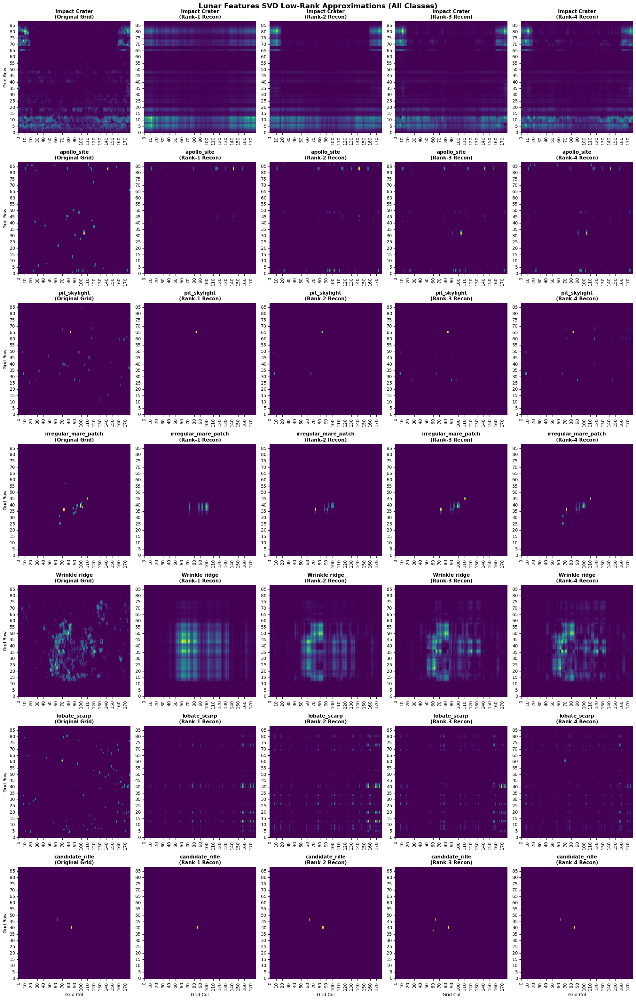

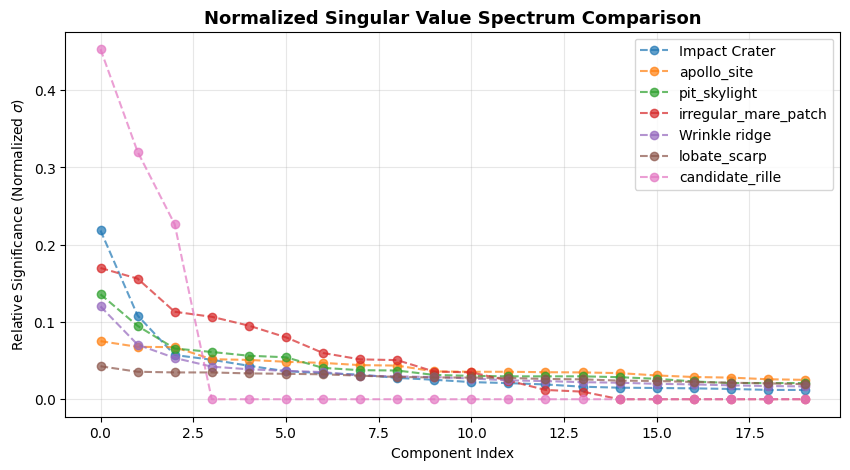

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد (مانند Impact Crater، Wrinkle ridge و پچ‌ها)
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)
k_values = [1, 2, 3, 4]

# تعریف محدوده کامل ماتریس بر اساس کل محدوده سطر و ستون موجود در داده‌ها
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت یک شبکه (Grid) از نمودارها
# تعداد ردیف‌ها = تعداد کلاس‌ها | تعداد ستون‌ها = ۴ (ماتریس اصلی + ۳ بازسازی)
fig, axes = plt.subplots(num_classes, 5, figsize=(20, 4.5 * num_classes), squeeze=False)

# ۳. حلقه روی هر فیچر برای اعمال SVD و رسم بازسازی‌ها
for row_idx, cid in enumerate(unique_classes):
    
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # هماهنگ‌سازی ابعاد با کل شبکه جهت یکپارچگی ابعاد ماتریس‌ها
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # ج) اعمال SVD روی ماتریس این فیچر
    U, S, Vt = np.linalg.svd(M, full_matrices=False)
    
    # د) رسم ماتریس اصلی (ستون اول در ردیف فعلی)
    sns.heatmap(M, cmap='viridis', ax=axes[row_idx, 0], cbar=False)
    axes[row_idx, 0].set_title(f"{cid}\n(Original Grid)", fontsize=11, fontweight='bold')
    axes[row_idx, 0].invert_yaxis()
    axes[row_idx, 0].set_ylabel("Grid Row", fontsize=10)
    if row_idx == num_classes - 1:
        axes[row_idx, 0].set_xlabel("Grid Col", fontsize=10)

    # ه) حلقه روی مقادیر k برای بازسازی و رسم (ستون‌های ۲ تا ۴)
    for col_idx, k in enumerate(k_values, start=1):
        # بازسازی ماتریس با k مؤلفه اول
        M_reconstructed = U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]
        
        # فیلتر کردن مقادیر منفی (زیرا تعداد منفی در دنیای واقعی معنا ندارد)
        M_reconstructed = np.clip(M_reconstructed, a_min=0, a_max=None)
        
        # رسم ماتریس بازسازی‌شده
        sns.heatmap(M_reconstructed, cmap='viridis', ax=axes[row_idx, col_idx], cbar=False)
        
        title_text = f"Rank-{k} Recon" if k == 1 else f"Rank-{k} Recon"
        axes[row_idx, col_idx].set_title(f"{cid}\n({title_text})", fontsize=11, fontweight='bold')
        axes[row_idx, col_idx].invert_yaxis()
        
        if row_idx == num_classes - 1:
            axes[row_idx, col_idx].set_xlabel("Grid Col", fontsize=10)

# تنظیمات نهایی ظاهر نمودار
plt.suptitle("Lunar Features SVD Low-Rank Approximations (All Classes)", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("./SVDs.png")
plt.show()


# --- رسم اختیاری طیف مقادیر تکین (Scree Plot) برای مقایسه نرخ کاهش واریانس فیچرها ---
plt.figure(figsize=(10, 5))
for cid in unique_classes:
    feature_data = DATA[DATA['class_id'] == cid]
    heatmap_matrix = feature_data.groupby(['grid_row', 'grid_col']).size().unstack(fill_value=0)
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    _, S, _ = np.linalg.svd(M, full_matrices=False)
    
    # نرمال‌سازی مقادیر تکین برای مقایسه عادلانه (تقسیم بر مجموع)
    S_normalized = S / np.sum(S)
    plt.plot(S_normalized[:20], marker='o', label=cid, alpha=0.7, linestyle='--')

plt.title("Normalized Singular Value Spectrum Comparison", fontsize=13, fontweight='bold')
plt.xlabel("Component Index")
plt.ylabel("Relative Significance (Normalized $\sigma$)")
plt.legend()
plt.grid(True, alpha=0.3)
plt.savefig("./rSVDs.png")
plt.show()

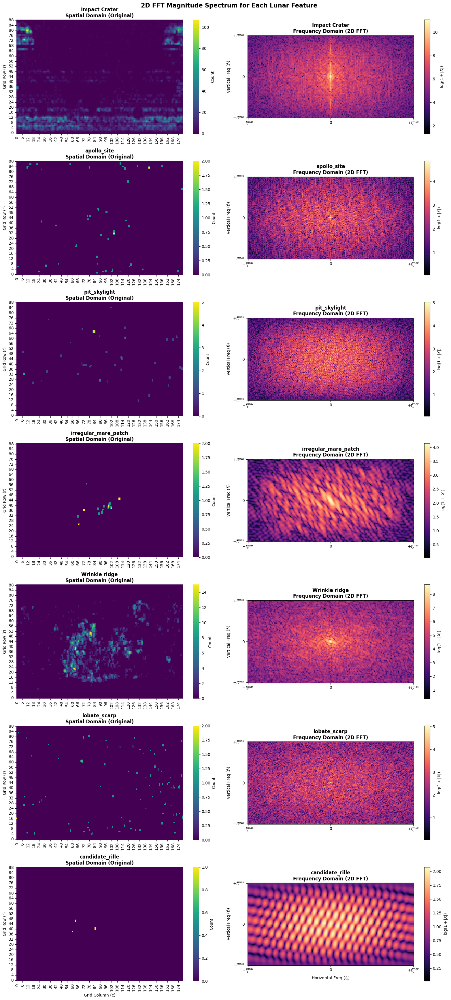

In [82]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد موجود در داده‌ها
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# تعریف محدوده کامل ماتریس بر اساس کل شبکه سطر و ستون جهت یکپارچگی ابعاد
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت شبکه نمودارها (تعداد ردیف‌ها = تعداد کلاس‌ها | تعداد ستون‌ها = ۲)
fig, axes = plt.subplots(num_classes, 2, figsize=(16, 5 * num_classes), squeeze=False)

# ۳. حلقه روی هر فیچر برای محاسبه FFT و رسم خروجی‌ها
for idx, cid in enumerate(unique_classes):
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # هماهنگ‌سازی ابعاد با کل شبکه و پر کردن جاهای خالی با 0
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # ج) محاسبه تبدیل فوریه دوبعدی و انتقال فرکانس صفر به مرکز
    fft_raw = np.fft.fft2(M)
    fft_shifted = np.fft.fftshift(fft_raw)
    
    # د) محاسبه طیف جزیی دامنه (Magnitude Spectrum) با مقیاس لگاریتمی
    magnitude_spectrum = np.abs(fft_shifted)
    log_magnitude = np.log1p(magnitude_spectrum)
    
    # ه) رسم نمودار سمت چپ: ماتریس فضایی اصلی (Spatial Domain)
    sns.heatmap(M, cmap='viridis', ax=axes[idx, 0], cbar=True, cbar_kws={'label': 'Count'})
    axes[idx, 0].set_title(f"{cid}\nSpatial Domain (Original)", fontsize=12, fontweight='bold')
    axes[idx, 0].set_ylabel("Grid Row (r)", fontsize=10)
    axes[idx, 0].invert_yaxis()
    if idx == num_classes - 1:
        axes[idx, 0].set_xlabel("Grid Column (c)", fontsize=10)
        
    # و) رسم نمودار سمت راست: طیف فرکانسی (Frequency Domain)
    im = axes[idx, 1].imshow(log_magnitude, cmap='magma', origin='lower')
    fig.colorbar(im, ax=axes[idx, 1], label=r'$\log(1 + |X|)$')
    
    # تنظیم برچسب‌های محورها حول نقطه صفر فرکانسی
    rows, cols = M.shape
    axes[idx, 1].set_xticks([0, cols//2, cols-1])
    axes[idx, 1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 1].set_yticks([0, rows//2, rows-1])
    axes[idx, 1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    
    axes[idx, 1].set_title(f"{cid}\nFrequency Domain (2D FFT)", fontsize=12, fontweight='bold')
    axes[idx, 1].set_ylabel("Vertical Freq ($f_r$)", fontsize=10)
    if idx == num_classes - 1:
        axes[idx, 1].set_xlabel("Horizontal Freq ($f_c$)", fontsize=10)

# تنظیمات نهایی ساختار چیدمان
plt.suptitle("2D FFT Magnitude Spectrum for Each Lunar Feature", fontsize=15, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("fft.png")
plt.show()

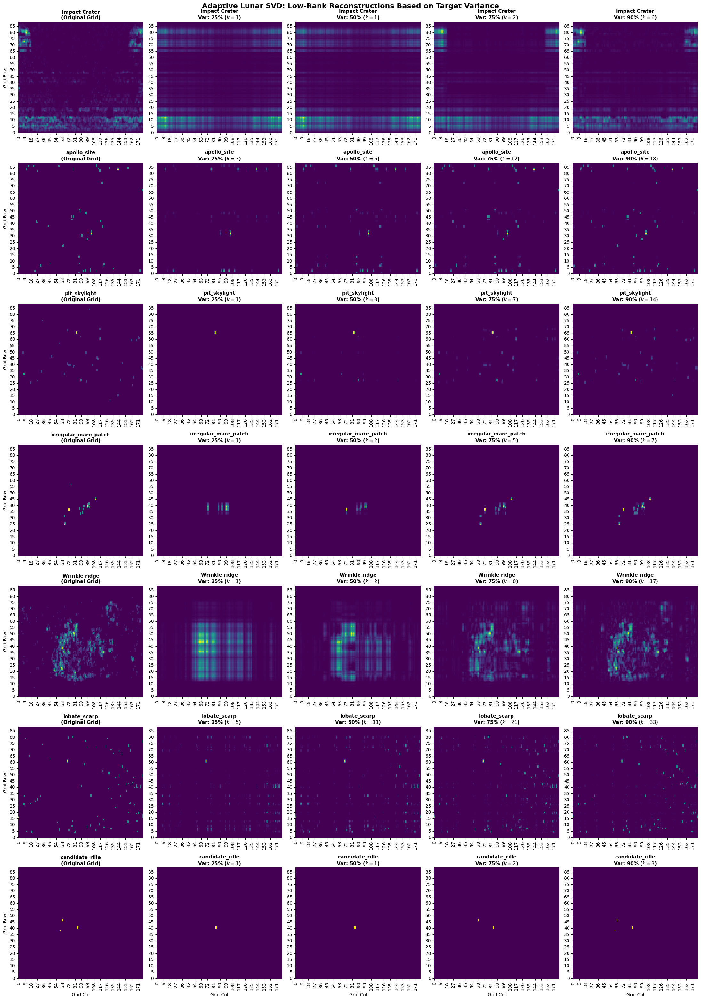

In [86]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# به جای مقادیر عددی ثابت، نسبت‌های واریانس مورد نظر را مشخص می‌کنیم (مثلاً ۲۵٪، ۵۰٪، ۷۵٪ و ۹۰٪)
variance_thresholds = [0.25, 0.50, 0.75, 0.90]

all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# شبکه نمودارها: تعداد ردیف‌ها = تعداد کلاس‌ها | ۵ ستون (ماتریس اصلی + ۴ بازسازی تطبیقی)
fig, axes = plt.subplots(num_classes, 5, figsize=(22, 4.5 * num_classes), squeeze=False)

for row_idx, cid in enumerate(unique_classes):
    feature_data = DATA[DATA['class_id'] == cid]
    
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # اعمال SVD
    U, S, Vt = np.linalg.svd(M, full_matrices=False)
    
    # محاسبه واریانس تجمعی توصیف‌شده (Cumulative Explained Variance)
    # توان دو مقادیر تکین متناسب با انرژی یا واریانس هر مود است
    energies = S ** 2
    cumulative_variance = np.cumsum(energies) / np.sum(energies)
    
    # ستون اول: رسم ماتریس اصلی
    sns.heatmap(M, cmap='viridis', ax=axes[row_idx, 0], cbar=False)
    axes[row_idx, 0].set_title(f"{cid}\n(Original Grid)", fontsize=11, fontweight='bold')
    axes[row_idx, 0].invert_yaxis()
    axes[row_idx, 0].set_ylabel("Grid Row", fontsize=10)
    if row_idx == num_classes - 1:
        axes[row_idx, 0].set_xlabel("Grid Col", fontsize=10)

    # ستون‌های بعدی: انتخاب پویای k بر اساس آستانه واریانس
    for col_idx, target_var in enumerate(variance_thresholds, start=1):
        # پیدا کردن اولین تعداد مؤلفه‌ای (k) که شرط واریانس را برآورده می‌کند
        # به دلیل صفر بودن اندیس در پایتون، ۱ واحد به آن اضافه می‌کنیم
        k = np.argmax(cumulative_variance >= target_var) + 1
        
        # بازسازی با k مؤلفه اختصاصی این کلاس
        M_reconstructed = U[:, :k] @ np.diag(S[:k]) @ Vt[:k, :]
        M_reconstructed = np.clip(M_reconstructed, a_min=0, a_max=None)
        
        # رسم ماتریس بازسازی‌شده پویای کلاس
        sns.heatmap(M_reconstructed, cmap='viridis', ax=axes[row_idx, col_idx], cbar=False)
        
        # نمایش دادن تعداد دقیق k انتخاب‌شده در بالای هر مود، تفاوت فیزیکی کلاس‌ها را فاش می‌کند
        axes[row_idx, col_idx].set_title(f"{cid}\nVar: {int(target_var*100)}% ($k={k}$)", fontsize=11, fontweight='bold')
        axes[row_idx, col_idx].invert_yaxis()
        
        if row_idx == num_classes - 1:
            axes[row_idx, col_idx].set_xlabel("Grid Col", fontsize=10)

plt.suptitle("Adaptive Lunar SVD: Low-Rank Reconstructions Based on Target Variance", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("./Adaptive_SVDs.png")
plt.show()

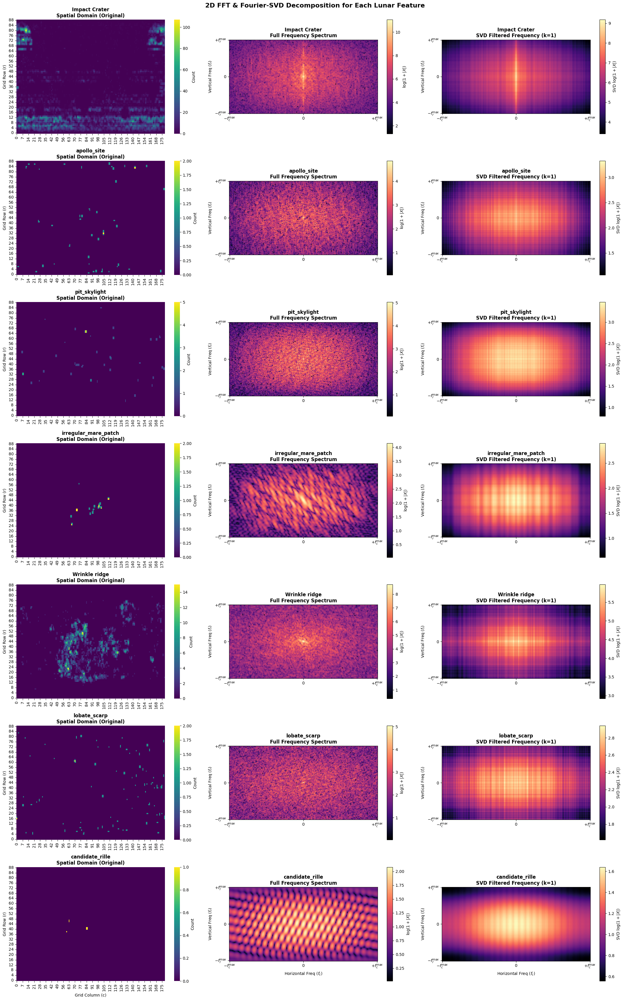

In [88]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد موجود در داده‌ها
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# تعریف محدوده کامل ماتریس بر اساس کل شبکه سطر و ستون جهت یکپارچگی ابعاد
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت شبکه نمودارها (حالا ۳ ستون داریم: فضای اصلی، طیف فوریه کامل، و بازسازی SVD)
fig, axes = plt.subplots(num_classes, 3, figsize=(22, 5 * num_classes), squeeze=False)

# انتخاب مقدار k برای بازسازی SVD روی طیف فرکانسی (مثلاً k=7 برای استخراج فاز پراکنده/گسسته)
k_target = 1 

# ۳. حلقه روی هر فیچر برای محاسبه FFT، اعمال SVD و رسم خروجی‌ها
for idx, cid in enumerate(unique_classes):
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # هماهنگ‌سازی ابعاد با کل شبکه و پر کردن جاهای خالی با 0
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # ج) محاسبه تبدیل فوریه دوبعدی و انتقال فرکانس صفر به مرکز
    fft_raw = np.fft.fft2(M)
    fft_shifted = np.fft.fftshift(fft_raw)
    
    # د) محاسبه طیف جزیی دامنه (Magnitude Spectrum) با مقیاس لگاریتمی
    magnitude_spectrum = np.abs(fft_shifted)
    log_magnitude = np.log1p(magnitude_spectrum)
    
    # ------------------ گام جدید: اعمال SVD روی ماتریس فرکانسی ------------------
    # تجزیه ماتریس طیف فرکانسی لگاریتمی
    U, S, Vt = np.linalg.svd(log_magnitude, full_matrices=False)
    
    # محدود کردن به k مقدار تکین اول برای بازسازی
    k = min(k_target, len(S)) # اطمینان از اینکه k بزرگتر از ابعاد ماتریس نباشد
    S_k = np.zeros((k, k))
    np.fill_diagonal(S_k, S[:k])
    
    # بازسازی ماتریس فرکانسی در بعد k
    svd_reconstructed_spectrum = np.dot(U[:, :k], np.dot(S_k, Vt[:k, :]))
    # ------------------------------------------------------------------------
    
    # ه) رسم نمودار سمت چپ: ماتریس فضایی اصلی (Spatial Domain)
    sns.heatmap(M, cmap='viridis', ax=axes[idx, 0], cbar=True, cbar_kws={'label': 'Count'})
    axes[idx, 0].set_title(f"{cid}\nSpatial Domain (Original)", fontsize=12, fontweight='bold')
    axes[idx, 0].set_ylabel("Grid Row (r)", fontsize=10)
    axes[idx, 0].invert_yaxis()
    if idx == num_classes - 1:
        axes[idx, 0].set_xlabel("Grid Column (c)", fontsize=10)
        
    # و) رسم نمودار وسط: طیف فرکانسی کامل (Full Frequency Domain)
    im1 = axes[idx, 1].imshow(log_magnitude, cmap='magma', origin='lower')
    fig.colorbar(im1, ax=axes[idx, 1], label=r'$\log(1 + |X|)$')
    
    rows, cols = M.shape
    axes[idx, 1].set_xticks([0, cols//2, cols-1])
    axes[idx, 1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 1].set_yticks([0, rows//2, rows-1])
    axes[idx, 1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    axes[idx, 1].set_title(f"{cid}\nFull Frequency Spectrum", fontsize=12, fontweight='bold')
    axes[idx, 1].set_ylabel("Vertical Freq ($f_r$)", fontsize=10)
    if idx == num_classes - 1:
        axes[idx, 1].set_xlabel("Horizontal Freq ($f_c$)", fontsize=10)

    # ز) رسم نمودار سمت راست: بازسازی طیف فرکانسی با SVD (SVD Reconstructed)
    im2 = axes[idx, 2].imshow(svd_reconstructed_spectrum, cmap='magma', origin='lower')
    fig.colorbar(im2, ax=axes[idx, 2], label=r'SVD $\log(1 + |X|)$')
    
    axes[idx, 2].set_xticks([0, cols//2, cols-1])
    axes[idx, 2].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 2].set_yticks([0, rows//2, rows-1])
    axes[idx, 2].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    axes[idx, 2].set_title(f"{cid}\nSVD Filtered Frequency (k={k})", fontsize=12, fontweight='bold')
    axes[idx, 2].set_ylabel("Vertical Freq ($f_r$)", fontsize=10)
    if idx == num_classes - 1:
        axes[idx, 2].set_xlabel("Horizontal Freq ($f_c$)", fontsize=10)

# تنظیمات نهایی ساختار چیدمان
plt.suptitle("2D FFT & Fourier-SVD Decomposition for Each Lunar Feature", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("fft_svd_analysis.png")
plt.show()

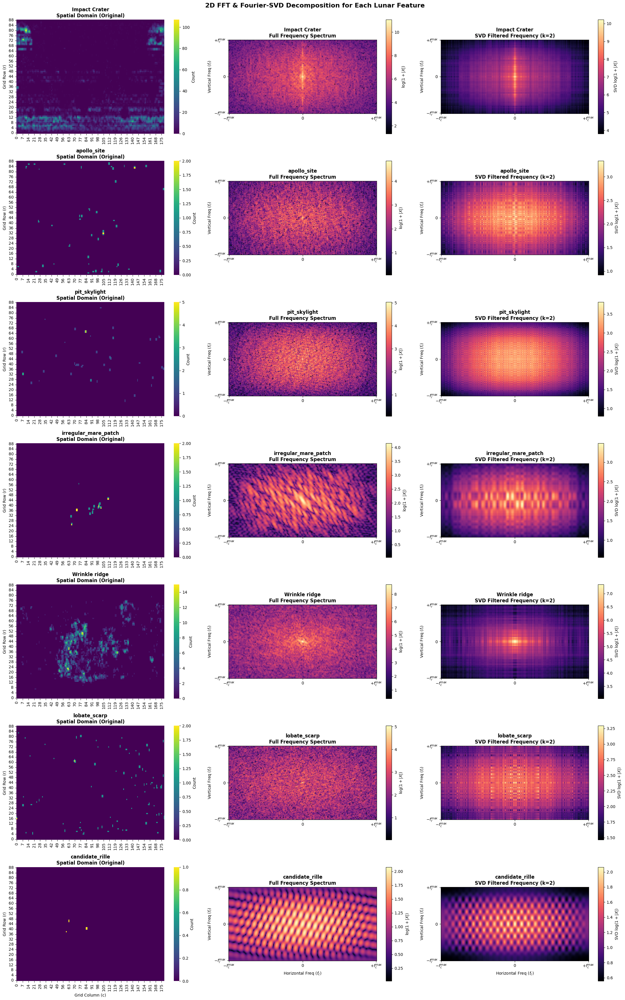

In [89]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد موجود در داده‌ها
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# تعریف محدوده کامل ماتریس بر اساس کل شبکه سطر و ستون جهت یکپارچگی ابعاد
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت شبکه نمودارها (حالا ۳ ستون داریم: فضای اصلی، طیف فوریه کامل، و بازسازی SVD)
fig, axes = plt.subplots(num_classes, 3, figsize=(22, 5 * num_classes), squeeze=False)

# انتخاب مقدار k برای بازسازی SVD روی طیف فرکانسی (مثلاً k=7 برای استخراج فاز پراکنده/گسسته)
k_target = 2 

# ۳. حلقه روی هر فیچر برای محاسبه FFT، اعمال SVD و رسم خروجی‌ها
for idx, cid in enumerate(unique_classes):
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # هماهنگ‌سازی ابعاد با کل شبکه و پر کردن جاهای خالی با 0
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    
    # ج) محاسبه تبدیل فوریه دوبعدی و انتقال فرکانس صفر به مرکز
    fft_raw = np.fft.fft2(M)
    fft_shifted = np.fft.fftshift(fft_raw)
    
    # د) محاسبه طیف جزیی دامنه (Magnitude Spectrum) با مقیاس لگاریتمی
    magnitude_spectrum = np.abs(fft_shifted)
    log_magnitude = np.log1p(magnitude_spectrum)
    
    # ------------------ گام جدید: اعمال SVD روی ماتریس فرکانسی ------------------
    # تجزیه ماتریس طیف فرکانسی لگاریتمی
    U, S, Vt = np.linalg.svd(log_magnitude, full_matrices=False)
    
    # محدود کردن به k مقدار تکین اول برای بازسازی
    k = min(k_target, len(S)) # اطمینان از اینکه k بزرگتر از ابعاد ماتریس نباشد
    S_k = np.zeros((k, k))
    np.fill_diagonal(S_k, S[:k])
    
    # بازسازی ماتریس فرکانسی در بعد k
    svd_reconstructed_spectrum = np.dot(U[:, :k], np.dot(S_k, Vt[:k, :]))
    # ------------------------------------------------------------------------
    
    # ه) رسم نمودار سمت چپ: ماتریس فضایی اصلی (Spatial Domain)
    sns.heatmap(M, cmap='viridis', ax=axes[idx, 0], cbar=True, cbar_kws={'label': 'Count'})
    axes[idx, 0].set_title(f"{cid}\nSpatial Domain (Original)", fontsize=12, fontweight='bold')
    axes[idx, 0].set_ylabel("Grid Row (r)", fontsize=10)
    axes[idx, 0].invert_yaxis()
    if idx == num_classes - 1:
        axes[idx, 0].set_xlabel("Grid Column (c)", fontsize=10)
        
    # و) رسم نمودار وسط: طیف فرکانسی کامل (Full Frequency Domain)
    im1 = axes[idx, 1].imshow(log_magnitude, cmap='magma', origin='lower')
    fig.colorbar(im1, ax=axes[idx, 1], label=r'$\log(1 + |X|)$')
    
    rows, cols = M.shape
    axes[idx, 1].set_xticks([0, cols//2, cols-1])
    axes[idx, 1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 1].set_yticks([0, rows//2, rows-1])
    axes[idx, 1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    axes[idx, 1].set_title(f"{cid}\nFull Frequency Spectrum", fontsize=12, fontweight='bold')
    axes[idx, 1].set_ylabel("Vertical Freq ($f_r$)", fontsize=10)
    if idx == num_classes - 1:
        axes[idx, 1].set_xlabel("Horizontal Freq ($f_c$)", fontsize=10)

    # ز) رسم نمودار سمت راست: بازسازی طیف فرکانسی با SVD (SVD Reconstructed)
    im2 = axes[idx, 2].imshow(svd_reconstructed_spectrum, cmap='magma', origin='lower')
    fig.colorbar(im2, ax=axes[idx, 2], label=r'SVD $\log(1 + |X|)$')
    
    axes[idx, 2].set_xticks([0, cols//2, cols-1])
    axes[idx, 2].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 2].set_yticks([0, rows//2, rows-1])
    axes[idx, 2].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    axes[idx, 2].set_title(f"{cid}\nSVD Filtered Frequency (k={k})", fontsize=12, fontweight='bold')
    axes[idx, 2].set_ylabel("Vertical Freq ($f_r$)", fontsize=10)
    if idx == num_classes - 1:
        axes[idx, 2].set_xlabel("Horizontal Freq ($f_c$)", fontsize=10)

# تنظیمات نهایی ساختار چیدمان
plt.suptitle("2D FFT & Fourier-SVD Decomposition for Each Lunar Feature", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("fft_svd_analysis.png")
plt.show()

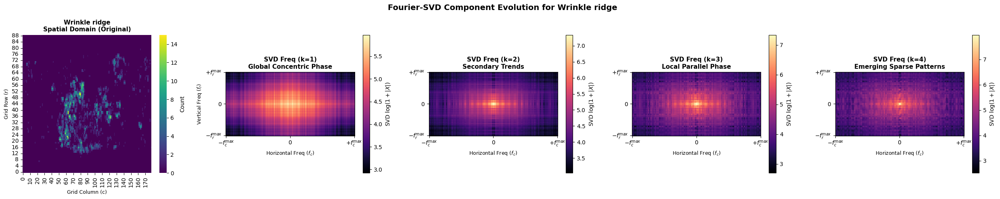

In [91]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. فیلتر کردن داده‌ها دقیقاً برای کلاس wrinkle_ridge
target_class = 'Wrinkle ridge' # یا هر Class ID دقیقی که در دیتای شما دارد، مثلاً 'wrinkle_ridge' یا کد عددی آن
feature_data = DATA[DATA['class_id'] == target_class]

# تعریف محدوده کامل ماتریس بر اساس کل شبکه سطر و ستون جهت یکپارچگی ابعاد
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت شبکه نمودارها (۱ ردیف و ۵ ستون: ماتریس اصلی + ۴ بازسازی SVD فرکانسی)
fig, axes = plt.subplots(1, 5, figsize=(25, 5))

# ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای wrinkle_ridge
heatmap_matrix = (
    feature_data.groupby(['grid_row', 'grid_col'])
    .size()
    .unstack(fill_value=0)
)
# هماهنگ‌سازی ابعاد با کل شبکه و پر کردن جاهای خالی با 0
heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
M = heatmap_matrix.to_numpy().astype(float)

# ج) محاسبه تبدیل فوریه دوبعدی و انتقال فرکانس صفر به مرکز
fft_raw = np.fft.fft2(M)
fft_shifted = np.fft.fftshift(fft_raw)

# د) محاسبه طیف جزیی دامنه با مقیاس لگاریتمی
magnitude_spectrum = np.abs(fft_shifted)
log_magnitude = np.log1p(magnitude_spectrum)

# ه) رسم ستون اول: ماتریس فضایی اصلی (Spatial Domain)
sns.heatmap(M, cmap='viridis', ax=axes[0], cbar=True, cbar_kws={'label': 'Count'})
axes[0].set_title(f"{target_class}\nSpatial Domain (Original)", fontsize=11, fontweight='bold')
axes[0].set_ylabel("Grid Row (r)", fontsize=9)
axes[0].set_xlabel("Grid Column (c)", fontsize=9)
axes[0].invert_yaxis()

# و) اعمال SVD روی ماتریس فرکانسی لگاریتمی
U, S, Vt = np.linalg.svd(log_magnitude, full_matrices=False)

rows, cols = M.shape
k_list = [1, 2, 3, 4]  # چهار مولفه اول بازسازی

# حلقه برای رسم بازسازی‌های SVD فرکانسی برای k=1 تا k=4
for i, k in enumerate(k_list, start=1):
    # ساخت ماتریس سیگما برای k مولفه
    S_k = np.zeros((k, k))
    np.fill_diagonal(S_k, S[:k])
    
    # بازسازی ماتریس فرکانسی در بعد k
    svd_reconstructed_spectrum = np.dot(U[:, :k], np.dot(S_k, Vt[:k, :]))
    
    # رسم در ستون مربوطه
    im = axes[i].imshow(svd_reconstructed_spectrum, cmap='magma', origin='lower')
    fig.colorbar(im, ax=axes[i], label=r'SVD $\log(1 + |X|)$')
    
    # تنظیمات محورها
    axes[i].set_xticks([0, cols//2, cols-1])
    axes[i].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[i].set_yticks([0, rows//2, rows-1])
    axes[i].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    
    # عنوان‌دهی فیزیکی متناسب با اضافه شدن مولفه‌ها
    if k == 1:
        title = f"SVD Freq (k={k})\nGlobal Concentric Phase"
    elif k == 2:
        title = f"SVD Freq (k={k})\nSecondary Trends"
    elif k == 3:
        title = f"SVD Freq (k={k})\nLocal Parallel Phase"
    else:
        title = f"SVD Freq (k={k})\nEmerging Sparse Patterns"
        
    axes[i].set_title(title, fontsize=11, fontweight='bold')
    axes[i].set_xlabel("Horizontal Freq ($f_c$)", fontsize=9)
    if i == 1:
        axes[i].set_ylabel("Vertical Freq ($f_r$)", fontsize=9)

# تنظیمات نهایی چیدمان
plt.suptitle(f"Fourier-SVD Component Evolution for {target_class}", fontsize=14, fontweight='bold', y=0.98)
plt.tight_layout()
plt.savefig("wrinkle_ridge_fourier_svd.png")
plt.show()

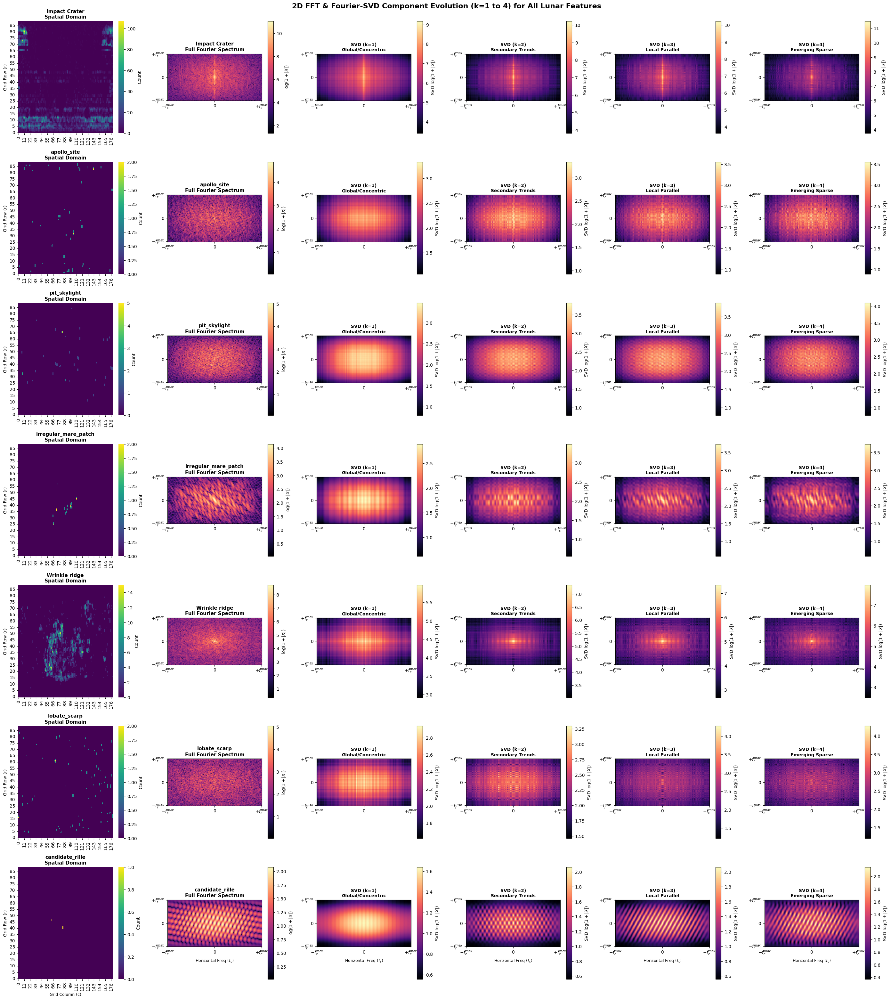

In [92]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ۱. یافتن لیست تمام کلاس‌های منحصربه‌فرد موجود در داده‌ها
unique_classes = DATA['class_id'].unique()
num_classes = len(unique_classes)

# تعریف محدوده کامل ماتریس بر اساس کل شبکه سطر و ستون جهت یکپارچگی ابعاد
all_rows = range(DATA['grid_row'].min(), DATA['grid_row'].max() + 1)
all_cols = range(DATA['grid_col'].min(), DATA['grid_col'].max() + 1)

# ۲. ساخت شبکه نمودارها (تعداد ردیف‌ها = تعداد کلاس‌ها | ۶ ستون برای نمایش تحولات SVD)
fig, axes = plt.subplots(num_classes, 6, figsize=(28, 4.5 * num_classes), squeeze=False)

k_list = [1, 2, 3, 4]

# ۳. حلقه روی هر فیچر برای محاسبه FFT، اعمال SVD در مقادیر مختلف k و رسم خروجی‌ها
for idx, cid in enumerate(unique_classes):
    # الف) فیلتر کردن داده‌ها برای کلاس فعلی
    feature_data = DATA[DATA['class_id'] == cid]
    
    # ب) ساخت ماتریس ۲بعدی فراوانی (Heatmap) برای این فیچر خاص
    heatmap_matrix = (
        feature_data.groupby(['grid_row', 'grid_col'])
        .size()
        .unstack(fill_value=0)
    )
    # هماهنگ‌سازی ابعاد با کل شبکه و پر کردن جاهای خالی با 0
    heatmap_matrix = heatmap_matrix.reindex(index=all_rows, columns=all_cols, fill_value=0)
    M = heatmap_matrix.to_numpy().astype(float)
    rows, cols = M.shape
    
    # ج) محاسبه تبدیل فوریه دوبعدی و انتقال فرکانس صفر به مرکز
    fft_raw = np.fft.fft2(M)
    fft_shifted = np.fft.fftshift(fft_raw)
    
    # د) محاسبه طیف جزیی دامنه (Magnitude Spectrum) با مقیاس لگاریتمی
    magnitude_spectrum = np.abs(fft_shifted)
    log_magnitude = np.log1p(magnitude_spectrum)
    
    # ه) رسم ستون اول: ماتریس فضایی اصلی (Spatial Domain)
    sns.heatmap(M, cmap='viridis', ax=axes[idx, 0], cbar=True, cbar_kws={'label': 'Count'})
    axes[idx, 0].set_title(f"{cid}\nSpatial Domain", fontsize=11, fontweight='bold')
    axes[idx, 0].set_ylabel("Grid Row (r)", fontsize=10)
    axes[idx, 0].invert_yaxis()
    if idx == num_classes - 1:
        axes[idx, 0].set_xlabel("Grid Column (c)", fontsize=9)
        
    # و) رسم ستون دوم: طیف فرکانسی کامل (Full Frequency Domain)
    im1 = axes[idx, 1].imshow(log_magnitude, cmap='magma', origin='lower')
    fig.colorbar(im1, ax=axes[idx, 1], label=r'$\log(1 + |X|)$')
    axes[idx, 1].set_title(f"{cid}\nFull Fourier Spectrum", fontsize=11, fontweight='bold')
    
    axes[idx, 1].set_xticks([0, cols//2, cols-1])
    axes[idx, 1].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
    axes[idx, 1].set_yticks([0, rows//2, rows-1])
    axes[idx, 1].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
    if idx == num_classes - 1:
        axes[idx, 1].set_xlabel("Horizontal Freq ($f_c$)", fontsize=9)

    # ز) اعمال SVD روی ماتریس فرکانسی لگاریتمی
    U, S, Vt = np.linalg.svd(log_magnitude, full_matrices=False)
    
    # ح) حلقه روی مقادیر k=1 تا k=4 و رسم آن‌ها در ستون‌های ۳ تا ۶
    for s_idx, k in enumerate(k_list, start=2):
        # محدود کردن ابعاد سیگما متناسب با سایز ماتریس
        k_val = min(k, len(S))
        S_k = np.zeros((k_val, k_val))
        np.fill_diagonal(S_k, S[:k_val])
        
        # بازسازی طیف فرکانسی لگاریتمی در بعد k
        svd_reconstructed_spectrum = np.dot(U[:, :k_val], np.dot(S_k, Vt[:k_val, :]))
        
        # رسم خروجی SVD
        im_svd = axes[idx, s_idx].imshow(svd_reconstructed_spectrum, cmap='magma', origin='lower')
        fig.colorbar(im_svd, ax=axes[idx, s_idx], label=r'SVD $\log(1 + |X|)$')
        
        # تنظیم برچسب محورهای فرکانسی
        axes[idx, s_idx].set_xticks([0, cols//2, cols-1])
        axes[idx, s_idx].set_xticklabels([r'$-f_c^{max}$', r'$0$', r'$+f_c^{max}$'])
        axes[idx, s_idx].set_yticks([0, rows//2, rows-1])
        axes[idx, s_idx].set_yticklabels([r'$-f_r^{max}$', r'$0$', r'$+f_r^{max}$'])
        
        # تعریف عناوین بر اساس مقدار k
        if k == 1:
            sub_title = "Global/Concentric"
        elif k == 2:
            sub_title = "Secondary Trends"
        elif k == 3:
            sub_title = "Local Parallel"
        else:
            sub_title = "Emerging Sparse"
            
        axes[idx, s_idx].set_title(f"SVD (k={k_val})\n{sub_title}", fontsize=10, fontweight='bold')
        if idx == num_classes - 1:
            axes[idx, s_idx].set_xlabel("Horizontal Freq ($f_c$)", fontsize=9)

# تنظیمات نهایی ساختار چیدمان کل نمودارها
plt.suptitle("2D FFT & Fourier-SVD Component Evolution (k=1 to 4) for All Lunar Features", fontsize=16, fontweight='bold', y=0.99)
plt.tight_layout()
plt.savefig("all_features_fourier_svd_evolution.png")
plt.show()